<a href="https://colab.research.google.com/github/sidak1701/Games/blob/main/AI_Submit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import  GridSearchCV

from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

import warnings
warnings.simplefilter(action="ignore", category=Warning)

In [ ]:
#Loading the Data
raw_df = pd.read_csv("/content/Train.csv")
raw_df.shape

(15000, 54)

In [ ]:
#Creating a copy of the original data
df = raw_df.copy()
df.head()

,X,Y,OBJECTID,INDEX_,ACCNUM,DATE,TIME,STREET1,STREET2,OFFSET,...,SPEEDING,AG_DRIV,REDLIGHT,ALCOHOL,DISABILITY,HOOD_158,NEIGHBOURHOOD_158,HOOD_140,NEIGHBOURHOOD_140,DIVISION
0,635468.3685,4839880.764,1,3389067,893184.0,2006/01/01 10:00:00+00,236,WOODBINE AVE,O CONNOR DR,NaN,...,Yes,Yes,NaN,Yes,NaN,60,Woodbine-Lumsden,60,Woodbine-Lumsden (60),D55
1,635468.3685,4839880.764,2,3389068,893184.0,2006/01/01 10:00:00+00,236,WOODBINE AVE,O CONNOR DR,NaN,...,Yes,Yes,NaN,Yes,NaN,60,Woodbine-Lumsden,60,Woodbine-Lumsden (60),D55
2,635468.3685,4839880.764,3,3389069,893184.0,2006/01/01 10:00:00+00,236,WOODBINE AVE,O CONNOR DR,NaN,...,Yes,Yes,NaN,Yes,NaN,60,Woodbine-Lumsden,60,Woodbine-Lumsden (60),D55
3,635468.3685,4839880.764,4,3389070,893184.0,2006/01/01 10:00:00+00,236,WOODBINE AVE,O CONNOR DR,NaN,...,Yes,Yes,NaN,Yes,NaN,60,Woodbine-Lumsden,60,Woodbine-Lumsden (60),D55
4,635468.3685,4839880.764,5,3389071,893184.0,2006/01/01 10:00:00+00,236,WOODBINE AVE,O CONNOR DR,NaN,...,Yes,Yes,NaN,Yes,NaN,60,Woodbine-Lumsden,60,Woodbine-Lumsden (60),D55


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 54 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   X                  15000 non-null  float64
 1   Y                  15000 non-null  float64
 2   OBJECTID           15000 non-null  int64  
 3   INDEX_             15000 non-null  int64  
 4   ACCNUM             11302 non-null  float64
 5   DATE               15000 non-null  object 
 6   TIME               15000 non-null  int64  
 7   STREET1            15000 non-null  object 
 8   STREET2            13657 non-null  object 
 9   OFFSET             1928 non-null   object 
 10  ROAD_CLASS         14643 non-null  object 
 11  DISTRICT           14984 non-null  object 
 12  LATITUDE           15000 non-null  float64
 13  LONGITUDE          15000 non-null  float64
 14  ACCLOC             9550 non-null   object 
 15  TRAFFCTL           14971 non-null  object 
 16  VISIBILITY         149

In [ ]:
#Check for null/missing values
df.isnull().sum()[df.isnull().sum() > 0]

,0
ACCNUM,3698
STREET2,1343
OFFSET,13072
ROAD_CLASS,357
DISTRICT,16
ACCLOC,5450
TRAFFCTL,29
VISIBILITY,14
RDSFCOND,19
INVTYPE,10


In [ ]:
#Check number of unique values
df.nunique()

,0
X,4695
Y,4695
OBJECTID,15000
INDEX_,15000
ACCNUM,3822
DATE,3082
TIME,1276
STREET1,1547
STREET2,2344
OFFSET,335


In [ ]:
#Checking for duplicates
df.duplicated().sum()

0

In [ ]:
#Printing the datatypes of the variables
df.dtypes

,0
X,float64
Y,float64
OBJECTID,int64
INDEX_,int64
ACCNUM,float64
DATE,object
TIME,int64
STREET1,object
STREET2,object
OFFSET,object


In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
X,15000.0,6.291535e+05,8.344053e+03,6.096257e+05,6.232854e+05,6.291708e+05,6.353472e+05,6.507842e+05
Y,15000.0,4.841002e+06,6.308487e+03,4.827606e+06,4.835641e+06,4.840093e+06,4.846111e+06,4.857444e+06
OBJECTID,15000.0,7.500500e+03,4.330271e+03,1.000000e+00,3.750750e+03,7.500500e+03,1.125025e+04,1.500000e+04
INDEX_,15000.0,2.897643e+07,3.465401e+07,3.363207e+06,5.293513e+06,6.714110e+06,8.024356e+07,8.154201e+07
ACCNUM,11302.0,3.193720e+08,1.067084e+09,1.284070e+05,1.005723e+06,1.158316e+06,1.308396e+06,4.008024e+09
TIME,15000.0,1.347333e+03,6.316010e+02,0.000000e+00,9.080000e+02,1.438000e+03,1.840000e+03,2.359000e+03
LATITUDE,15000.0,4.371077e+01,5.615761e-02,4.359205e+01,4.366265e+01,4.370281e+01,4.375646e+01,4.385545e+01
LONGITUDE,15000.0,-7.939683e+01,1.042243e-01,-7.963839e+01,-7.947004e+01,-7.939763e+01,-7.931919e+01,-7.912590e+01
FATAL_NO,593.0,2.877740e+01,1.774913e+01,1.000000e+00,1.400000e+01,2.800000e+01,4.200000e+01,7.800000e+01


In [ ]:
# Select numerical columns
df_numeric = df.select_dtypes(include='number')

# Plot histograms for all numerical columns
for column in df_numeric.columns:
    fig = px.histogram(df, x=column, nbins=20, title=f'Distribution of {column}')
    fig.update_layout(xaxis_title=column, yaxis_title='Frequency')
    fig.show()

In [ ]:
# Select Categorical columns
df_cat = df.select_dtypes(exclude='number')

# Plot histograms for all Categorical columns
for column in df_cat.columns:
    fig = px.histogram(df, x=column, nbins=20, title=f'Distribution of {column}')
    fig.update_layout(xaxis_title=column, yaxis_title='Frequency')
    fig.show()

In [ ]:
# Plot Barplots for all Categorical columns
for col in df_cat:
    counts = df[col].value_counts().reset_index()
    counts.columns = [col, 'count']
    fig = px.bar(counts, x=col, y='count',
                 labels={col: col, 'count': 'Count'}, title=f'Bar Plot of {col}')
    fig.show()

In [ ]:
#Setting Target variable
target = 'ACCLASS'

In [ ]:
df['ACCLOC'].value_counts()

,count
ACCLOC,
At Intersection,7044
Non Intersection,1480
Intersection Related,772
At/Near Private Drive,215
Private Driveway,13
Laneway,11
Overpass or Bridge,8
Underpass or Tunnel,6
Trail,1


In [ ]:
# Convert 'date' columns to datetime format
df['DATE'] = pd.to_datetime(df['DATE'], format='mixed')

In [ ]:
#Creating a new column 'INTERSECTION' = STREET1 if STREET2 = nan else STREET1 + STREET2 and dropping STREET1 and STREET2
df['INTERSECTION'] = np.where(df['STREET2'].isnull(), df['STREET1'], df['STREET1'] + ' ' + df['STREET2'])
df.drop(['STREET1', 'STREET2'], axis=1, inplace=True)

In [ ]:
#Cheching of intersection cotains any null value
df['INTERSECTION'].isnull().sum()

0

In [ ]:
#Dropping "ACCNUM" and "FATAL_NO" as they are unique identifiers and do not provide any insight
df.drop(['ACCNUM', 'FATAL_NO'], axis=1, inplace=True)

#Dropping "NEIGHBOURHOOD_158" and "NEIGHBOURHOOD_140" as there data is also represented by their unique identifiers
df.drop(['NEIGHBOURHOOD_158', 'NEIGHBOURHOOD_140'], axis=1, inplace=True)

In [ ]:
#Creating Function t0mreturn categorical and numerical columns list
def get_num_cat_cols(df):
    cat_cols=[]
    num_cols=[]

    for cols in df.columns:
      if pd.api.types.is_numeric_dtype(df[cols]):
        num_cols.append(cols)
      elif pd.api.types.is_object_dtype(df[cols]):
        cat_cols.append(cols)

    return num_cols, cat_cols

In [ ]:
#Creating list for categorical and nuerical columns
num_cols, cat_cols = get_num_cat_cols(df)
print("Categorical Columns:",len(cat_cols), cat_cols)
print("Numerical Columns:",len(num_cols), num_cols)

Categorical Columns: 41 ['OFFSET', 'ROAD_CLASS', 'DISTRICT', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT', 'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY', 'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDTYPE', 'PEDACT', 'PEDCOND', 'CYCLISTYPE', 'CYCACT', 'CYCCOND', 'PEDESTRIAN', 'CYCLIST', 'AUTOMOBILE', 'MOTORCYCLE', 'TRUCK', 'TRSN_CITY_VEH', 'EMERG_VEH', 'PASSENGER', 'SPEEDING', 'AG_DRIV', 'REDLIGHT', 'ALCOHOL', 'DISABILITY', 'HOOD_158', 'HOOD_140', 'DIVISION', 'INTERSECTION']
Numerical Columns: 7 ['X', 'Y', 'OBJECTID', 'INDEX_', 'TIME', 'LATITUDE', 'LONGITUDE']


In [ ]:
#Check null values in num_cols
df[num_cols].isnull().sum()

,0
X,0
Y,0
OBJECTID,0
INDEX_,0
TIME,0
LATITUDE,0
LONGITUDE,0


In [ ]:
#Check null values in cat_cols
df[cat_cols].isnull().sum()

,0
OFFSET,13072
ROAD_CLASS,357
DISTRICT,16
ACCLOC,5450
TRAFFCTL,29
VISIBILITY,14
LIGHT,0
RDSFCOND,19
ACCLASS,0
IMPACTYPE,0


In [ ]:
#Getting all the binary classifiers and imputing their null values with "No"
binary_cols = [col for col in cat_cols if df[col].nunique() == 1]
df[binary_cols] = df[binary_cols].fillna("No")

In [ ]:
#Getting all multi categorical cols
multi_cols = [col for col in cat_cols if df[col].nunique() > 2]

In [ ]:
#Cheching for null values in multi_cols list
df[multi_cols].isnull().sum()

,0
OFFSET,13072
ROAD_CLASS,357
DISTRICT,16
ACCLOC,5450
TRAFFCTL,29
VISIBILITY,14
LIGHT,0
RDSFCOND,19
IMPACTYPE,0
INVTYPE,10


In [ ]:
#Creating a new datarfame containing the percentage of missing value in multi_cols
missing_df = (df[multi_cols].isna().sum()/len(df[multi_cols])*100).to_frame().sort_values(by=0, ascending=False)

In [ ]:
#Getting the columns where the missing value percentage is greater than 80% and storing them in a list
cols_to_drop = missing_df[missing_df[0] > 80].index.tolist()

In [ ]:
cols_to_drop

['CYCCOND', 'CYCACT', 'CYCLISTYPE', 'OFFSET', 'PEDCOND', 'PEDACT', 'PEDTYPE']

In [ ]:
#Dropping the columns in 'cols_to_drop' list
df.drop(cols_to_drop, axis=1, inplace=True)

In [ ]:
#Creating list for categorical and nuerical columns agai after dropping columns
num_cols, cat_cols = get_num_cat_cols(df)
print("Categorical Columns:",len(cat_cols), cat_cols)
print("Numerical Columns:",len(num_cols), num_cols)

Categorical Columns: 34 ['ROAD_CLASS', 'DISTRICT', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT', 'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY', 'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN', 'CYCLIST', 'AUTOMOBILE', 'MOTORCYCLE', 'TRUCK', 'TRSN_CITY_VEH', 'EMERG_VEH', 'PASSENGER', 'SPEEDING', 'AG_DRIV', 'REDLIGHT', 'ALCOHOL', 'DISABILITY', 'HOOD_158', 'HOOD_140', 'DIVISION', 'INTERSECTION']
Numerical Columns: 7 ['X', 'Y', 'OBJECTID', 'INDEX_', 'TIME', 'LATITUDE', 'LONGITUDE']


In [ ]:
#Getting all multi categorical cols
multi_cols = [col for col in cat_cols if df[col].nunique() > 2]

In [ ]:
#As the the missing data is missing at random, therefore, will replace the missing values with "Unknown"
df[multi_cols] = df[multi_cols].fillna("Unknown")

In [ ]:
multi_cols

['ROAD_CLASS',
 'DISTRICT',
 'ACCLOC',
 'TRAFFCTL',
 'VISIBILITY',
 'LIGHT',
 'RDSFCOND',
 'IMPACTYPE',
 'INVTYPE',
 'INVAGE',
 'INJURY',
 'INITDIR',
 'VEHTYPE',
 'MANOEUVER',
 'DRIVACT',
 'DRIVCOND',
 'HOOD_158',
 'HOOD_140',
 'DIVISION',
 'INTERSECTION']

In [ ]:
df.shape

(15000, 42)

In [ ]:
#Splitting the dataset into test and train
X = df.drop(target, axis=1)
y = df[target]

label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=17)

In [ ]:
# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(drop='first', handle_unknown = "ignore"))
])

# Preprocessing for ordinal data
ordinal_transformer = Pipeline(steps=[
    ('ordinal', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1))
])

# preprocessing for numerical, categorical and ordinal features
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, num_cols),
        ('cat', categorical_transformer, binary_cols),
        ('ord', ordinal_transformer, multi_cols)
    ])

# Create the preprocessing pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor)])

# Fit the data into pipeline
pipeline.fit(X_train)

# Transform the data
x_train_transformed = pipeline.transform(X_train)
x_test_transformed = pipeline.transform(X_test)


In [ ]:
x_train_transformed.shape

(12000, 40)

In [ ]:
x_test_transformed.shape

(3000, 40)

#KNN GridSearch

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

n_neighbors =  [3, 5, 7, 9]  # Number of neighbors to consider
weights = ['uniform', 'distance'] # Weighting of neighbors ('uniform' or 'distance')
p = [1, 2] # Power parameter for the Minkowski metric (1 for Manhattan distance, 2 for Euclidean distance)

parameter_KNeighbors = {'n_neighbors' : n_neighbors, 'weights' : weights, 'p' : p}
knnG = KNeighborsClassifier(algorithm = 'auto')

grid_search_KNeighbors = GridSearchCV(knnG, parameter_KNeighbors, cv=4, scoring='roc_auc', refit = True, n_jobs = -1, verbose = 2)
grid_search_KNeighbors.fit(x_train_transformed,y_train)

KNeighbors_best_params_ = grid_search_KNeighbors.best_params_
KNeighbors_best_estimators_ = grid_search_KNeighbors.best_estimator_
print("Best Params:",KNeighbors_best_params_)
print("Best Estimators:",KNeighbors_best_estimators_)
print("Score:",KNeighbors_best_estimators_.score(x_train_transformed, y_train))

Fitting 4 folds for each of 16 candidates, totalling 64 fits
Best Params: {'n_neighbors': 9, 'p': 1, 'weights': 'distance'}
Best Estimators: KNeighborsClassifier(n_neighbors=9, p=1, weights='distance')
Score: 1.0


In [ ]:
#accuracy on test dataset
knn = KNeighbors_best_estimators_
pred_KNN = knn.predict(x_test_transformed)
print(accuracy_score(y_test, pred_KNN))

0.903


In [ ]:
precision = precision_score(y_test, pred_KNN)
recall = recall_score(y_test, pred_KNN)
f1 = f1_score(y_test, pred_KNN)
print("Precision:",precision)
print("Recall:",recall)
print("F1:",f1)

Precision: 0.9091880341880342
Recall: 0.9860950173812283
F1: 0.9460811561978877


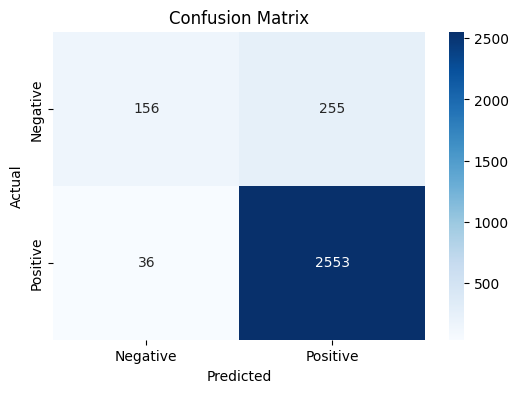

In [ ]:
# Create and plot confusion matrix
cm = confusion_matrix(y_test, pred_KNN)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

#ADABoost GridSearch

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

n_estimators = [5, 10, 15, 20]
learning_rate = [0.5, 0.05, 0.01]
algorithm = ['SAMME', 'SAMME.R']

Ada_Classifer = AdaBoostClassifier(random_state = 42)
parameter_Ada_Classifer = {'n_estimators' : n_estimators, 'learning_rate' : learning_rate, 'algorithm' : algorithm}
grid_search_AdaClassifier = GridSearchCV(Ada_Classifer, parameter_Ada_Classifer, cv = 4, scoring='roc_auc', refit = True, n_jobs = -1, verbose = 2)
grid_search_AdaClassifier.fit(x_train_transformed,y_train)

AdaClassifier_best_params_ = grid_search_AdaClassifier.best_params_
AdaClassifier_best_estimators_ = grid_search_AdaClassifier.best_estimator_
print(AdaClassifier_best_params_)
print(AdaClassifier_best_estimators_)
print(AdaClassifier_best_estimators_.score(x_train_transformed, y_train))

Fitting 4 folds for each of 24 candidates, totalling 96 fits
{'algorithm': 'SAMME.R', 'learning_rate': 0.5, 'n_estimators': 20}
AdaBoostClassifier(learning_rate=0.5, n_estimators=20, random_state=42)
0.91225


In [ ]:
#accuracy on test dataset
ada_boost = AdaClassifier_best_estimators_
pred_ada = ada_boost.predict(x_test_transformed)
print(accuracy_score(y_test, pred_ada))

0.9136666666666666


In [ ]:
precision = precision_score(y_test, pred_ada)
recall = recall_score(y_test, pred_ada)
f1 = f1_score(y_test, pred_ada)
print("Precision:",precision)
print("Recall:",recall)
print("F1:",f1)

Precision: 0.9090589887640449
Recall: 1.0
F1: 0.952363435718227


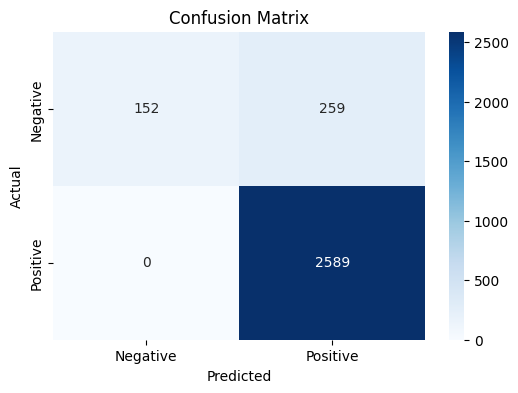

In [ ]:
# Create and plot confusion matrix
cm = confusion_matrix(y_test, pred_ada)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

#RFR GridSearch

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=42)

# Define the grid of hyperparameters to search
param_grid = {
    'n_estimators': [10, 20, 30],
    'max_depth': [5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=1)
grid_search.fit(x_train_transformed, y_train)

# Print the best parameters found
print("Best parameters:")
print(grid_search.best_params_)

# Evaluate the best model on the test set
rf_best_estimator = grid_search.best_estimator_
y_predicted = rf_best_estimator.predict(x_train_transformed)

print(rf_best_estimator.score(x_train_transformed, y_train))

Best parameters:
{'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 10}
0.9940833333333333


In [ ]:
#accuracy on test dataset
rfr = rf_best_estimator
pred_rfr = rfr.predict(x_test_transformed)
print(accuracy_score(y_test, pred_rfr))

0.9583333333333334


In [ ]:
precision = precision_score(y_test, pred_rfr)
recall = recall_score(y_test, pred_rfr)
f1 = f1_score(y_test, pred_rfr)
print("Precision:",precision)
print("Recall:",recall)
print("F1:",f1)

Precision: 0.9603886397608371
Recall: 0.9926612591734261
F1: 0.9762583095916431


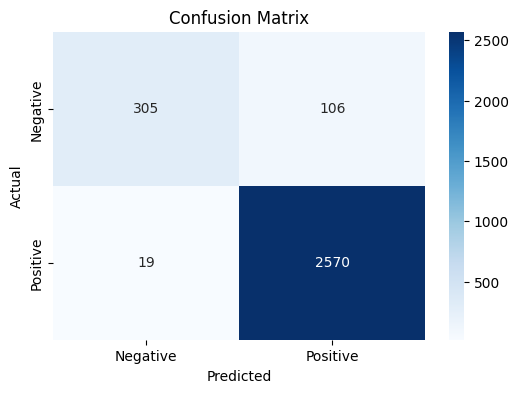

In [ ]:
# Create and plot confusion matrix
cm = confusion_matrix(y_test, pred_rfr)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

#Decision Tree GridSearch

In [ ]:
from sklearn.tree import DecisionTreeClassifier

param_grid = { 'criterion':['gini','entropy'],'max_depth': np.arange(3, 15)}
# decision tree model
dtree_model=DecisionTreeClassifier()
#use gridsearch to test all values
grid_search = GridSearchCV(dtree_model, param_grid, cv=5)
#fit model to data
grid_search.fit(x_train_transformed, y_train)

# Print the best parameters found
print("Best parameters")
print(grid_search.best_params_)

# Evaluate the best model on the test set
dtree_model_best_estimator = grid_search.best_estimator_
y_predicted = dtree_model_best_estimator.predict(x_train_transformed)

print(dtree_model_best_estimator.score(x_train_transformed, y_train))

Best parameters
{'criterion': 'entropy', 'max_depth': 14}
0.9720833333333333


In [ ]:
#accuracy on test dataset
dtree = dtree_model_best_estimator
pred_dtree = dtree.predict(x_test_transformed)
print(accuracy_score(y_test, pred_dtree))

0.9416666666666667


In [ ]:
precision = precision_score(y_test, pred_dtree)
recall = recall_score(y_test, pred_dtree)
f1 = f1_score(y_test, pred_dtree)
print("Precision:",precision)
print("Recall:",recall)
print("F1:",f1)

Precision: 0.9606870229007634
Recall: 0.9721900347624566
F1: 0.9664043002495681


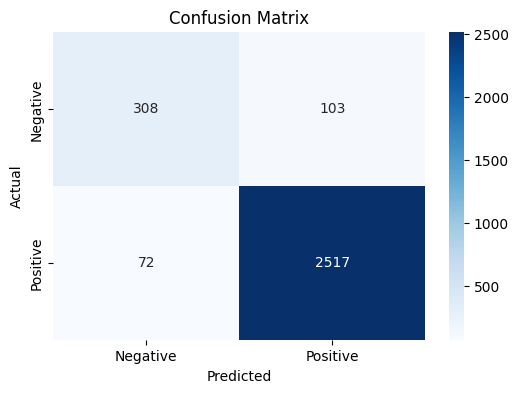

In [ ]:
# Create and plot confusion matrix
cm = confusion_matrix(y_test, pred_dtree)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

#XGBoost GridSearch

In [ ]:
import xgboost as xgb

XGB = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Perform GridSearchCV
grid_search = GridSearchCV(estimator=XGB, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)
grid_search.fit(x_train_transformed, y_train)

xgb_best_estimator = grid_search.best_estimator_

print(xgb_best_estimator.score(x_train_transformed, y_train))

print("Best parameters:", grid_search.best_params_)
print("Best score:",grid_search.best_score_)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
0.9954166666666666
Best parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}
Best score: 0.9608333333333332


In [ ]:
#accuracy on test dataset
XBG = xgb_best_estimator
pred_xgb = XBG.predict(x_test_transformed)
print(accuracy_score(y_test, pred_xgb))

0.9733333333333334


In [ ]:
precision = precision_score(y_test, pred_xgb)
recall = recall_score(y_test, pred_xgb)
f1 = f1_score(y_test, pred_xgb)
print("Precision:",precision)
print("Recall:",recall)
print("F1:",f1)

Precision: 0.9717939074840165
Recall: 0.9980687524140595
F1: 0.9847560975609756


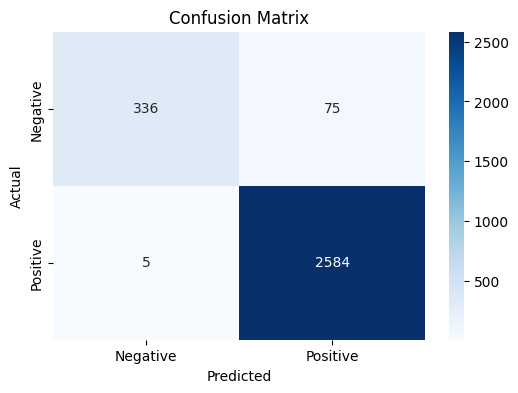

In [ ]:
# Create and plot confusion matrix
cm = confusion_matrix(y_test, pred_xgb)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

#Test Dataset

In [ ]:
test_df = pd.read_csv("/content/Test.csv")

In [ ]:
# Convert 'date' columns to datetime format
test_df['DATE'] = pd.to_datetime(test_df['DATE'], format='mixed')

#Creating a new column 'INTERSECTION' = STREET1 if STREET2 = nan else STREET1 + STREET2 and dropping STREET1 and STREET2
test_df['INTERSECTION'] = np.where(test_df['STREET2'].isnull(), test_df['STREET1'], test_df['STREET1'] + ' ' + test_df['STREET2'])
test_df.drop(['STREET1', 'STREET2'], axis=1, inplace=True)

#Dropping "ACCNUM" and "FATAL_NO" as they are unique identifiers and do not provide any insight
test_df.drop(['ACCNUM', 'FATAL_NO'], axis=1, inplace=True)

#Dropping "NEIGHBOURHOOD_158" and "NEIGHBOURHOOD_140" as there data is also represented by their unique identifiers
test_df.drop(['NEIGHBOURHOOD_158', 'NEIGHBOURHOOD_140'], axis=1, inplace=True)

In [ ]:
test_df.drop(cols_to_drop, axis=1, inplace=True)

In [ ]:
#Creating list for categorical and nuerical columns agai after dropping columns
num_cols_Test, cat_cols_Test = get_num_cat_cols(test_df)
print("Categorical Columns:",len(cat_cols), cat_cols_Test)
print("Numerical Columns:",len(num_cols), num_cols_Test)

Categorical Columns: 34 ['ROAD_CLASS', 'DISTRICT', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT', 'RDSFCOND', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY', 'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN', 'CYCLIST', 'AUTOMOBILE', 'MOTORCYCLE', 'TRUCK', 'TRSN_CITY_VEH', 'EMERG_VEH', 'PASSENGER', 'SPEEDING', 'AG_DRIV', 'REDLIGHT', 'ALCOHOL', 'DISABILITY', 'HOOD_158', 'HOOD_140', 'DIVISION', 'INTERSECTION']
Numerical Columns: 7 ['X', 'Y', 'OBJECTID', 'INDEX_', 'TIME', 'LATITUDE', 'LONGITUDE']


In [ ]:
#Getting all the binary classifiers and imputing their null values with "No"
binary_cols_Test = [col for col in cat_cols_Test if test_df[col].nunique() == 1]

test_df[binary_cols_Test] = test_df[binary_cols_Test].fillna("No")

#Getting all multi categorical cols
multi_cols_Test = [col for col in cat_cols_Test if test_df[col].nunique() > 2]

#As the the missing data is Missing at random, therefore, will replace the missing values with "Unknown"
test_df[multi_cols_Test] = test_df[multi_cols_Test].fillna("Unknown")

In [ ]:
Test_transformed = pipeline.transform(test_df)

In [ ]:
test_df.shape

(3956, 41)

In [ ]:
Test_transformed.shape

(3956, 40)

#KNN

In [ ]:
# Predict using the test data
pred_Test = knn.predict(Test_transformed)
# Reverse the encoding
pred_Test = label_encoder.inverse_transform(pred_Test)
df2 = pd.concat([test_df['OBJECTID'], pd.Series(pred_Test, name='ACCLASS')],axis=1)
df2.to_csv("predictionsFinalKNN.csv", index=False, header=True)

#RFR


In [ ]:
pred_RFR = rfr.predict(Test_transformed)
pred_RFR = label_encoder.inverse_transform(pred_RFR)
df2 = pd.concat([test_df['OBJECTID'], pd.Series(pred_RFR, name='ACCLASS')],axis=1)
df2.to_csv("predictionsFinalRFR.csv", index=False, header=True)

#XGBOOST

In [ ]:
pred_xgb = XBG.predict(Test_transformed)
pred_xgb = label_encoder.inverse_transform(pred_xgb)
df2 = pd.concat([test_df['OBJECTID'], pd.Series(pred_xgb, name='ACCLASS')],axis=1)
df2.to_csv("predictionsFinalXGB.csv", index=False, header=True)

#ADABOOST

In [ ]:
pred_ADA = ada_boost.predict(Test_transformed)
pred_ADA = label_encoder.inverse_transform(pred_ADA)
df2 = pd.concat([test_df['OBJECTID'], pd.Series(pred_ADA, name='ACCLASS')],axis=1)
df2.to_csv("predictionsFinalADA.csv", index=False, header=True)

#Decision Tree

In [ ]:
pred_dtree = dtree.predict(Test_transformed)
pred_dtree = label_encoder.inverse_transform(pred_dtree)
df2 = pd.concat([test_df['OBJECTID'], pd.Series(pred_dtree, name='ACCLASS')],axis=1)
df2.to_csv("predictionsFinalDTree.csv", index=False, header=True)